In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import json
from cryptocompy import coin,price
import tqdm
import seaborn as sns
sns.set();

import io
import requests
import json
from datetime import datetime
import time
from time import gmtime, strftime

from sklearn import metrics
from fbprophet import Prophet
plt.rcParams["figure.figsize"] = [14,8]
pd.set_option('float_format', '{:f}'.format)

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

df = pd.read_csv('/Users/Aagam/Downloads/Telegram Desktop/tokens.csv',sep=',',error_bad_lines=False)
cols = df.columns
df.reset_index(inplace=True)
df.columns = cols.tolist() + [0,1,2,3]

In [2]:
data =  pd.read_json('ico_price_daily_summaries.json')
data.head()

,close,created_at,date,high,ico_id,ico_symbol,id,low,open,updated_at,volume
0,16215.357422,2019-05-19 19:42:33,2018-01-08,17178.000000,1,BTC,994,15712.000000,17169.000000,2019-05-19 19:42:33,nan
1,14906.000000,2019-05-19 19:42:34,2018-01-09,16329.000000,1,BTC,995,13755.000000,16213.000000,2019-05-19 19:42:34,nan
2,14430.000000,2019-05-19 19:42:34,2018-01-10,15355.000000,1,BTC,996,14122.000000,14911.000000,2019-05-19 19:42:34,nan
3,14900.000000,2019-05-19 19:42:34,2018-01-11,14901.000000,1,BTC,997,13300.000000,14435.000000,2019-05-19 19:42:34,nan
4,13254.000000,2019-05-19 19:42:34,2018-01-12,14999.000000,1,BTC,998,12639.000000,14900.000000,2019-05-19 19:42:34,nan


In [3]:
coins = data['ico_symbol'].unique().tolist()

In [4]:
coins

['BTC',
 'ETH',
 'AVT',
 'OMG',
 'EOS',
 'LTC',
 'USDT',
 'XMR',
 'DASH',
 'NEO',
 'ZEC',
 'BTG',
 'SNT',
 'ETP',
 'SAN',
 'FUN',
 'EDO',
 'GNO',
 'TNB',
 'BAT',
 'TRX',
 'HOT',
 'GNT',
 'BCH',
 'XRP',
 'ELF',
 'ETC',
 'QTUM',
 'CND',
 'DRGN',
 'PAY',
 'KNC',
 'AST',
 'AION',
 'UTNP',
 'FSN',
 'LSK',
 'PAI',
 'GUSD',
 'RLC',
 'MAN',
 'UTK',
 'ZRX',
 'VEE',
 'POA',
 'QASH',
 'ZIL',
 'AGI',
 'ZCN',
 'BSV',
 'XTZ',
 'MKR',
 'USDC',
 'ENJ',
 'WTC',
 'DAI',
 'LRC',
 'ZEN',
 'ODE',
 'RIF',
 'MITH',
 'CTXC',
 'TKN',
 'REQ',
 'BFT',
 'MHC',
 'NEC',
 'ANT',
 'EDR',
 'RDN',
 'DATA',
 'THETA',
 'REP',
 'XVG',
 'MANA',
 'CAT',
 'ADA',
 'BCN',
 'NULS',
 'GBYTE',
 'CVT',
 'GRIN',
 'BEAM',
 'TNT',
 'LINK',
 'ICX',
 'KIN',
 'POWR',
 'PHX',
 'AMB',
 'FUEL',
 'QSP',
 'LEND',
 'GNX',
 'GTO',
 'QLC',
 'NGC',
 'JNT',
 'BLZ',
 'MOBI',
 'ABT',
 'LOOM',
 'ONT',
 'ELA',
 'SKM',
 'IOTX',
 'EGT',
 'QKC',
 'MET',
 'NXT',
 'BNB',
 'KMD',
 'WAVES',
 'STORJ',
 'DGTX',
 'DGD',
 'EDG',
 'AE',
 'XLM',
 'XEM',
 'DOGE',


In [4]:
current_time = int(time.time())
loop_time = current_time
df = pd.DataFrame()

In [13]:
def fun(loop_time):
    url="https://min-api.cryptocompare.com/data/histohour?fsym=EOS&tsym=USD&limit=6000&aggregate=1&toTs="+str(loop_time)+"&extraParams=your_app_name"
    s=requests.get(url).content
    k = json.loads(s)
    k = pd.DataFrame(k['Data'])
    return k

In [14]:
t = fun(loop_time)

In [18]:
coin

'BTC'

In [19]:
price.get_historical_data('EOS', 'USD', 'day', aggregate=1, limit=2000)

[{'time': '2014-02-19 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-20 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-21 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-22 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-23 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-24 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-25 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-26 05:30:00',
  'close': 0,
  'high': 0,
  'low': 0,
  'open': 0,
  'volumefrom': 0,
  'volumeto': 0},
 {'time': '2014-02-27 05

In [9]:
df = pd.DataFrame()
for coin in tqdm.tqdm_notebook(coins):
    data = price.get_historical_data(coin, 'BTC', 'day', aggregate=1, limit=2000)
    data = pd.DataFrame(data)
    data['coin'] = coin
    df = pd.concat([df,data])

ConnectionError: HTTPSConnectionPool(host='min-api.cryptocompare.com', port=443): Max retries exceeded with url: /data/histoday?fsym=BTC&tsym=BTC&e=CCCAGG&limit=2000 (Caused by NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0x0000023A7486DE48>: Failed to establish a new connection: [Errno 11001] getaddrinfo failed'))

In [8]:
df

""


In [9]:
df.to_csv('history.csv')

In [5]:
df = pd.read_csv('history.csv')
df['time'] = df['time'].apply(lambda x: x[:10])
df.set_index('time',inplace=True)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


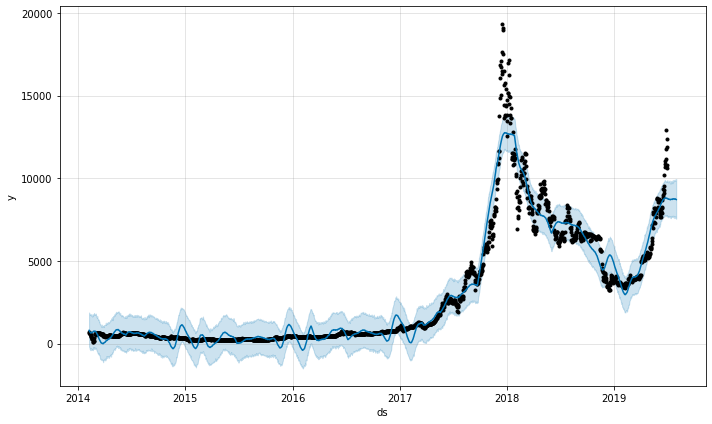

In [89]:
days = 30

data = df_btc[['close','time']]
data['close'] = data['close']#*100
train = data[:-days]
test = data[-days:]
train.columns = ['y','ds']
test.columns = ['y','ds']

model = Prophet(changepoint_prior_scale=0.5,n_changepoints=25).fit(train)

data_forecast = df_btc['time']
data_forecast = pd.DataFrame(data_forecast)
data_forecast.columns = ['ds']
forecast = model.predict(data_forecast)
model.plot(forecast);

In [129]:
close_price = data_plot['close'].iloc[-days-1]

In [132]:
(close_price - data_plot['close'].iloc[-1]) / close_price

0.07669372830293422

In [131]:
data_plot

,close,Real-Values,Forecasted
time,,,
2014-02-07,695.650000,nan,nan
2014-02-08,648.780000,nan,nan
2014-02-09,659.570000,nan,nan
2014-02-10,582.630000,nan,nan
2014-02-11,578.960000,nan,nan
2014-02-12,531.130000,nan,nan
2014-02-13,451.440000,nan,nan
2014-02-14,427.680000,nan,nan
2014-02-15,371.070000,nan,nan


In [130]:
(data_plot['Forecasted'] - close_price) / close_price

time
2014-02-07         nan
2014-02-08         nan
2014-02-09         nan
2014-02-10         nan
2014-02-11         nan
2014-02-12         nan
2014-02-13         nan
2014-02-14         nan
2014-02-15         nan
2014-02-16         nan
2014-02-17         nan
2014-02-18         nan
2014-02-19         nan
2014-02-20         nan
2014-02-21         nan
2014-02-22         nan
2014-02-23         nan
2014-02-24         nan
2014-02-25         nan
2014-02-26         nan
2014-02-27         nan
2014-02-28         nan
2014-03-01         nan
2014-03-02         nan
2014-03-03         nan
2014-03-04         nan
2014-03-05         nan
2014-03-06         nan
2014-03-07         nan
2014-03-08         nan
2014-03-09         nan
2014-03-10         nan
2014-03-11         nan
2014-03-12         nan
2014-03-13         nan
2014-03-14         nan
2014-03-15         nan
2014-03-16         nan
2014-03-17         nan
2014-03-18         nan
2014-03-19         nan
2014-03-20         nan
2014-03-21         nan
2014-0

RMSE:  1642.009575975986
MAE:  1349.0369046411092


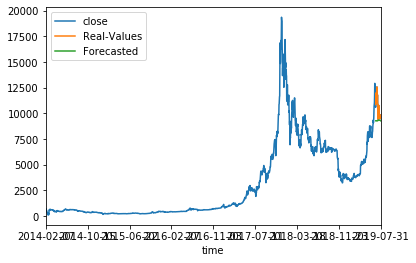

In [87]:
data_plot = pd.DataFrame()
data_plot = data['close']
data_plot.index = data['time']
data_plot = pd.DataFrame(data_plot)

test.index = test['ds']
data_plot['Real-Values'] = test['y']

forecast.index = forecast['ds']
temp = forecast['yhat'][-days:]
temp.index = temp.index.astype('str')
data_plot['Forecasted'] = temp
data_plot.plot()
print('RMSE: ',np.sqrt(metrics.mean_squared_error(test['y'], temp)))
print('MAE: ',metrics.mean_absolute_error(test['y'], temp))

In [32]:
data = df[df['coin'] == 'LINK']
#data = data[data['close']!=0]

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -8.03484181735615
Predicted ROI:  -17.77114908407041


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -27.79345276540776
Predicted ROI:  -12.8672894042115


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -35.403120936280885
Predicted ROI:  85.86575538993702


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.169338265515826
Predicted ROI:  4.137402612782239


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.05455447181352
Predicted ROI:  61.586251883017795


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.61074427325344
Predicted ROI:  -28.208548632676155


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  0.0
Predicted ROI:  174.33654041489345


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -9.671983823859806
Predicted ROI:  23.26810607861745


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -31.633512602863995
Predicted ROI:  -55.83041994111906


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -31.224127735068002
Predicted ROI:  -5.192571437293933


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -35.21818707253637
Predicted ROI:  -270.1203218927867


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.408472012102884
Predicted ROI:  18.67107017359167


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.35289828654757
Predicted ROI:  177.59706532683617


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -56.42538975501113
Predicted ROI:  -2.4511544942057832


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -32.814885496183216
Predicted ROI:  17.559629846984688


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -43.90243902439025
Predicted ROI:  4320.484034107006


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.726897500573262
Predicted ROI:  1.2709195414123169


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.37833037300177
Predicted ROI:  -391.15097661857783


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.425129087779695
Predicted ROI:  10.565871200178108


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.53172205438067
Predicted ROI:  23.81718393797656


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -31.684081130915796
Predicted ROI:  4.1422593779480055


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  27.65861706914653
Predicted ROI:  25.417647674356125


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -28.22771213748657
Predicted ROI:  44.126701227529736


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -20.849049804194802
Predicted ROI:  33.296693200824166


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -21.419768301700774
Predicted ROI:  12.773456618834786


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.963202386872204
Predicted ROI:  14.086756972371708


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.177505738332055
Predicted ROI:  -70.28152594122706


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -40.64726236515367
Predicted ROI:  85.60827801485075


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.032448377581126
Predicted ROI:  44.60913634520527


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  10.159362549800793
Predicted ROI:  13.01964092472994


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -18.59005311443747
Predicted ROI:  623.3628119948258


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -23.534041715859896
Predicted ROI:  -370.647591577312


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -25.492654962379085
Predicted ROI:  3.24833667925166


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -8.773234200743497
Predicted ROI:  39.44781084417071


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -3.5546982639845623
Predicted ROI:  13.314013007243505


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -4.160982264665753
Predicted ROI:  -66.89271625135451


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -21.3963963963964
Predicted ROI:  -76.44616407342927


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -34.854014598540154
Predicted ROI:  23.787246575973175


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  1.7479300827966886
Predicted ROI:  3.9228444461268643


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.63524590163935
Predicted ROI:  82.36900281977158


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -12.937903123814346
Predicted ROI:  -7.083814557772004


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -32.503485361481786
Predicted ROI:  54.65950727403668


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -27.72180695482613
Predicted ROI:  16.446895208456286


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -2.655771195097036
Predicted ROI:  12.168838421992328


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.249213341724364
Predicted ROI:  6.300870543483528


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -18.70407481629926
Predicted ROI:  5.414497375431711


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.096718480138165
Predicted ROI:  21.45569652533021


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -15.30673019654557
Predicted ROI:  12.155104881865695


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  9.932013006207514
Predicted ROI:  31.159352675897544


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.053081331054585
Predicted ROI:  87.2784979218084


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  35.71661414756059
Predicted ROI:  92.65224570355215


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -6.053738546320147
Predicted ROI:  12.01065080187133


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -0.4975124378109347
Predicted ROI:  0.9387803445955544


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -31.979575805184602
Predicted ROI:  23.064262221409702


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  30.613668061366806
Predicted ROI:  67.16336051672917


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  0.49191848208010286
Predicted ROI:  0.6428756626275856


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -17.080135641620554
Predicted ROI:  12.943489035013167


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -23.949350507586498
Predicted ROI:  222.3339619899776


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -38.43324751746965
Predicted ROI:  5.52017452893499


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  45.029808979194556
Predicted ROI:  -7.253624760445461


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.686807653575023
Predicted ROI:  4.812987521401588


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -37.241075363596295
Predicted ROI:  16.243403983117673


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -25.96815834767641
Predicted ROI:  -44.68578401392477


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.88310362429811
Predicted ROI:  19.956085769185126


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  14.572864321608042
Predicted ROI:  19.336092822399547


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.137199434229128
Predicted ROI:  -62.599623137248805


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  28.04183971696662
Predicted ROI:  5.047603164852179


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -13.502538071065986
Predicted ROI:  22.317324405188945


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.623376623376622
Predicted ROI:  51.21918892072258


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -28.03510482691371
Predicted ROI:  18.21589172475326


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  2.657807308970107
Predicted ROI:  1.0738362647570114


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.835309617918313
Predicted ROI:  -33.67615594707258


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -28.633540372670808
Predicted ROI:  11.7024546312848


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -15.909090909090907
Predicted ROI:  33.43720848570087


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -8.089330024813899
Predicted ROI:  14.607556912981604


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -28.17087845968712
Predicted ROI:  31.30530912871802


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -19.556237460167587
Predicted ROI:  -77.84179961898464


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -42.55857441425586
Predicted ROI:  14.722651745548118


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -22.031473533619465
Predicted ROI:  -873.8557513298642


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.644359781348353
Predicted ROI:  -51.794638963665484


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -34.90066225165563
Predicted ROI:  108.48679479103092


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -42.791666666666664
Predicted ROI:  -84.09034872194998


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -40.12669962917182
Predicted ROI:  -34.291816176189926


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -14.801790281329923
Predicted ROI:  31.819101214629452


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -3.7393767705382275
Predicted ROI:  -755.663740175344


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.315196998123827
Predicted ROI:  30.193953467168587


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -48.5934065934066
Predicted ROI:  62.9661894459379


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -25.320677270395066
Predicted ROI:  -11.844828920733196


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -45.8613554061045
Predicted ROI:  186.37656181588287


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.624706434945992
Predicted ROI:  31.024044981859035


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -38.49011543054265
Predicted ROI:  9.438080869956893


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  6.71887881286066
Predicted ROI:  8.002415894999206


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.476484723652582
Predicted ROI:  5.701153515390438


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.00239020017927
Predicted ROI:  28.743818323855802


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -50.2178928479877
Predicted ROI:  7.002508080086227


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -16.093657379964426
Predicted ROI:  -20.320708623228903


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -17.1769019248396
Predicted ROI:  29.038473210184545


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -9.961868446139187
Predicted ROI:  -22.25877507867451


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.219143576826195
Predicted ROI:  64.46629549963264


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -37.76202684361334
Predicted ROI:  9.843205594461368


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -50.845000000000006
Predicted ROI:  -0.8220828430204219


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -41.7125900805426
Predicted ROI:  -12.96000631813389


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  69.5855614973262
Predicted ROI:  64.31849658044668


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.294389014054275
Predicted ROI:  -23.066323763815543


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  40.62182483235113
Predicted ROI:  -12.652965578767875


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -32.81888334089877
Predicted ROI:  -65.42473675625853


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -27.6658270361041
Predicted ROI:  24.751704476745743


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.279999999999994
Predicted ROI:  -3.823594457601409


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -16.651583710407238
Predicted ROI:  29.228842854047564


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -23.974082073434122
Predicted ROI:  30.661995772216027


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.61333333333334
Predicted ROI:  -36.86843868322993


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.96894409937888
Predicted ROI:  100.9451080798819


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -23.21724709784412
Predicted ROI:  68.7671889926493


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -25.057825751734768
Predicted ROI:  -51.196358564527245


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  2.384381501040164
Predicted ROI:  -236.48314319538167


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.21873657069187
Predicted ROI:  -44.3034767818838


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -20.6155303030303
Predicted ROI:  78.85345464470511


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.194374795595774
Predicted ROI:  -13.746894974329676


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -13.950654888821203
Predicted ROI:  0.27968149412263543


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -13.428280773143431
Predicted ROI:  -49.178650759789605


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -2.106847253574118
Predicted ROI:  44.88962409411279


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -21.40896614821591
Predicted ROI:  26.540449468358222


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -8.3629191321499
Predicted ROI:  25.448472982967623


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -0.39840637450199234
Predicted ROI:  0.7972018674638157


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.704076580293766
Predicted ROI:  10734.238099144737


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -19.760000000000012
Predicted ROI:  24.496409698718928


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -18.72074882995318
Predicted ROI:  -20.532149982559204


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -40.89683074848279
Predicted ROI:  -31.19008664856177


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -38.697157243260264
Predicted ROI:  5.9037839498156375


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -32.72153713794093
Predicted ROI:  145.69216337311138


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -17.243549402139717
Predicted ROI:  -98.31350159217214


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  15.378990982208146
Predicted ROI:  -2.531624423642048


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -27.97202797202797
Predicted ROI:  10.036021898813322


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -0.09980039920160796
Predicted ROI:  -0.6763146315374103


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -4.502541757443717
Predicted ROI:  -9.455666025944499


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -37.07116788321167
Predicted ROI:  36.357094149919675


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -29.14992768761048
Predicted ROI:  42.2119095503936


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.54487760652765
Predicted ROI:  -31.56885729473103


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -21.90265486725665
Predicted ROI:  63.223285725741086


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.51433691756272
Predicted ROI:  -24.96574627750808


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  2.9220049449314436
Predicted ROI:  -30.969371286726787


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -36.0523278183917
Predicted ROI:  21.7449108396986


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  13.175355450236975
Predicted ROI:  10.328201034703834


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.68638239339752
Predicted ROI:  -63.16829521976541


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -19.927862939585204
Predicted ROI:  -45.591976537760196


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -23.339976922270004
Predicted ROI:  -100.93259593206989


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -5.274759880333802
Predicted ROI:  -14.421344169588721


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -3.580786026200867
Predicted ROI:  1.3314576984851871


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -50.5933117583603
Predicted ROI:  -47.951141632866964


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -32.45586868999689
Predicted ROI:  5.095314425423485


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  3.4560480841472554
Predicted ROI:  107.66940878059114


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -42.555190230155006
Predicted ROI:  -1.1535791086519267


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -25.392781316348202
Predicted ROI:  33.324950057217904


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -13.52136043135628
Predicted ROI:  36.570143124114935


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -3.1638230909391973
Predicted ROI:  3.4244145781724376


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -12.60623229461756
Predicted ROI:  -248.82506853896126


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -21.849929211892405
Predicted ROI:  15.056893269954033


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -22.795481369077738
Predicted ROI:  138.48165933746554


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -10.325476992143647
Predicted ROI:  30.275440549633508


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -7.246376811594206
Predicted ROI:  41.37192087479849


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -9.878825220784549
Predicted ROI:  -1.9529673333209638


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -3.0803906836964634
Predicted ROI:  10.068927651114935


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.974842767295602
Predicted ROI:  14.058532796310205


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -27.185153704490716
Predicted ROI:  47.46199695310152


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -2.600860126971111
Predicted ROI:  -46.83972402774012


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.67205542725173
Predicted ROI:  83.71337609416956


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -33.16110850164396
Predicted ROI:  30.474613003897627


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -73.23383084577114
Predicted ROI:  240.3315453298972


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -26.380789022298462
Predicted ROI:  1.68654750114265


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -24.97142857142856
Predicted ROI:  -26.02570613079448


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -31.850631521142216
Predicted ROI:  -37.64964219231706


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Actual ROI:  -30.981366459627324
Predicted ROI:  219.92206180994853



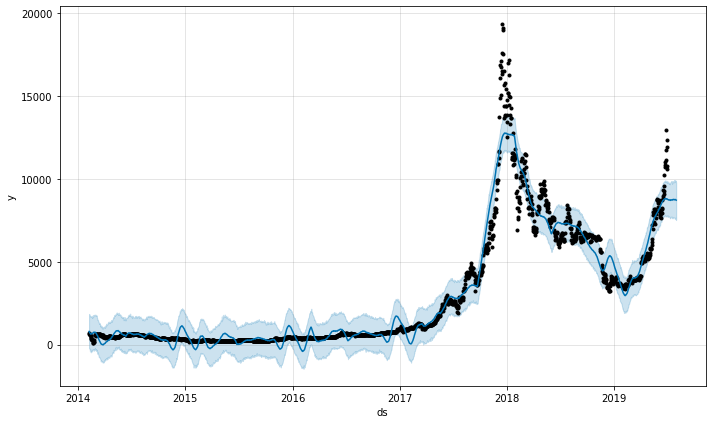

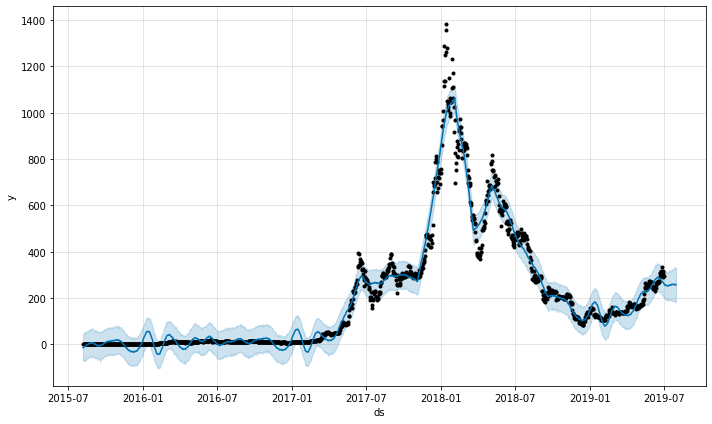

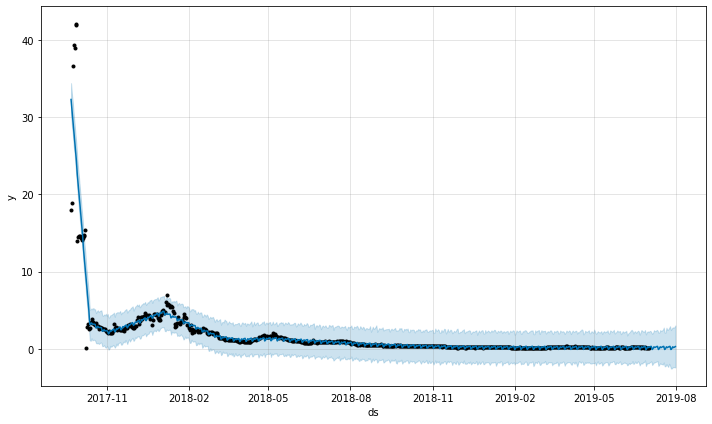

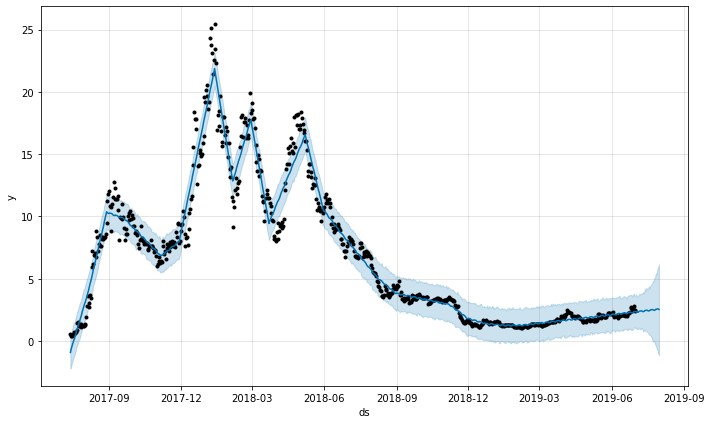

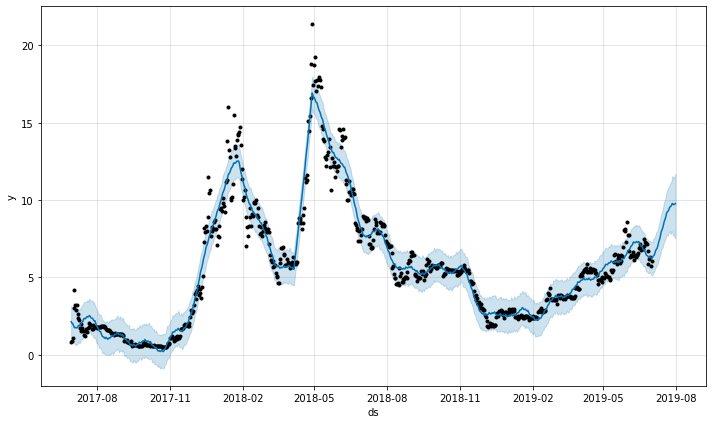

...

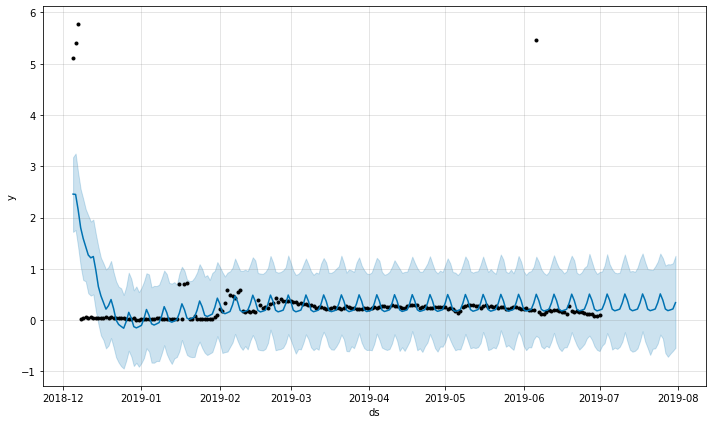

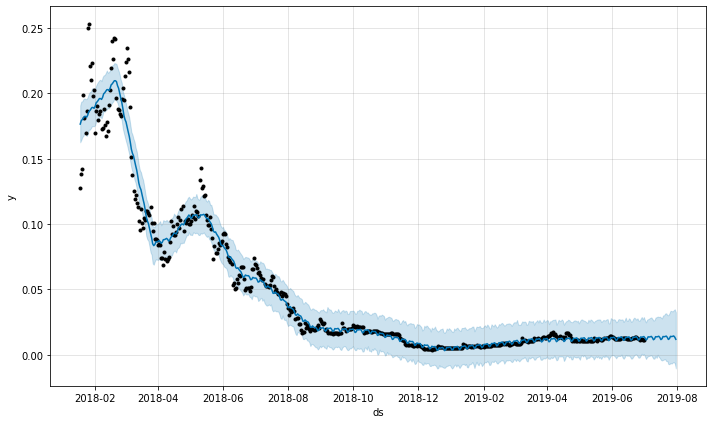

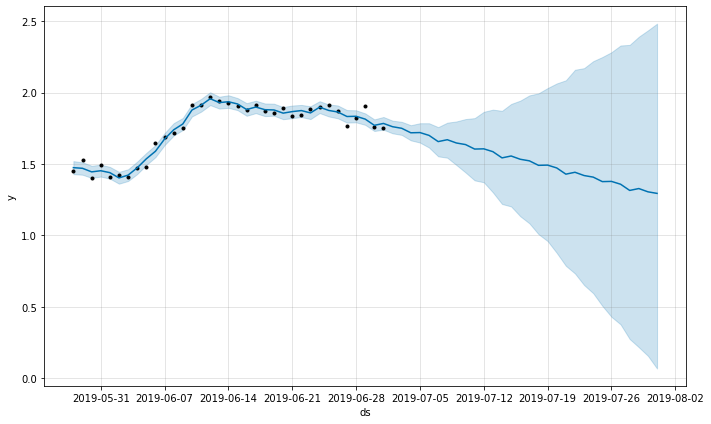

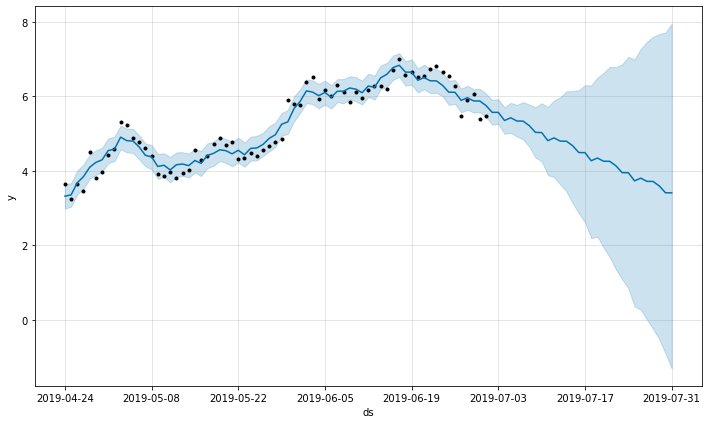

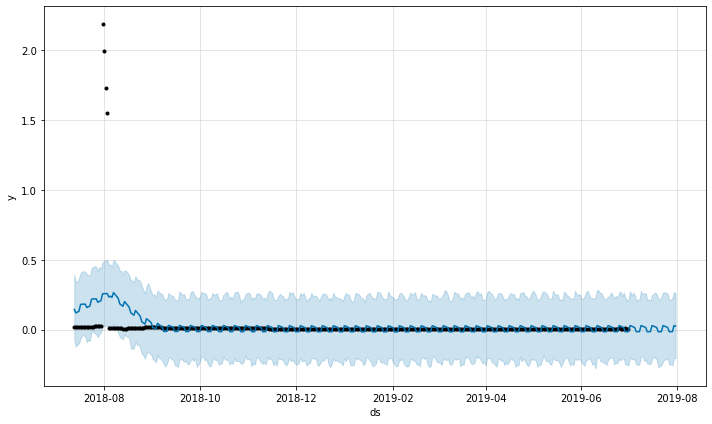

In [21]:
days = 30
final = pd.DataFrame()
for coin in tqdm.tqdm_notebook(coins):
    data = df[['close','high','low','open']][df['coin'] == coin]
    data = data[data['close']!=0]
    if data.shape[0] >= 60:
        
        data = pd.DataFrame(data['close'])
        data['time'] = data.index
        train = data[:-days]
        test = data[-days:]
        train.columns = ['y','ds']
        test.columns = ['y','ds']

        model = Prophet(changepoint_prior_scale=0.5,n_changepoints=25).fit(train)

        data_forecast = data['time']
        data_forecast = pd.DataFrame(data_forecast)
        data_forecast.columns = ['ds']
        forecast = model.predict(data_forecast)
        model.plot(forecast);
        
        
        data_plot = pd.DataFrame()
        data_plot = data['close']
        data_plot.index = data['time']
        data_plot = pd.DataFrame(data_plot)

        test.index = test['ds']
        data_plot['Real-Values'] = test['y']

        forecast.index = forecast['ds']
        temp = forecast['yhat'][-days:]
        temp.index = temp.index.astype('str')
        data_plot['Forecasted'] = temp
        #print('RMSE: ',np.sqrt(metrics.mean_squared_error(test['y'], temp)))
        #print('MAE: ',metrics.mean_absolute_error(test['y'], temp))
        
        close_price = data_plot['close'].iloc[-days-1]
        act_roi = (data_plot['close'].iloc[-1] - close_price) / close_price * 100
        print('Actual ROI: ', act_roi)
        pred_roi = (data_plot['Forecasted'].iloc[-1] - close_price) / close_price * 100
        #pred_roi = pred_roi[-1]
        print('Predicted ROI: ',pred_roi)
        
        val = pd.DataFrame([coin,act_roi,pred_roi])
        final = pd.concat([final, val])

In [92]:
final[['Coin','Actual ROI','Predicted ROI']]

,Coin,Actual ROI,Predicted ROI
0,BTC,-8.034842,-17.771149
1,ETH,-27.793453,-12.867289
2,AVT,-35.403121,85.865755
3,OMG,-36.169338,4.137403
4,EOS,-30.054554,61.586252
5,LTC,-24.610744,-28.208549
6,USDT,0.000000,174.336540
7,XMR,-9.671984,23.268106
8,DASH,-31.633513,-55.830420
9,NEO,-31.224128,-5.192571


In [50]:
final[final['Actual ROI'] > 0]

,Coin,Actual ROI,Predicted ROI,Act Roi,Pred Roi,Act,Pred
21,HOT,27.658617,25.417648,High Positive Returns,High Positive Returns,Positive Returns,Positive Returns
29,DRGN,10.159363,13.019641,Positive Returns,Positive Returns,Positive Returns,Positive Returns
38,GUSD,1.747930,3.922844,Positive Returns,Positive Returns,Negative Returns,Negative Returns
48,ZCN,9.932013,31.159353,Positive Returns,High Positive Returns,Positive Returns,Positive Returns
50,XTZ,35.716614,92.652246,High Positive Returns,High Positive Returns,Positive Returns,Positive Returns
54,WTC,30.613668,67.163361,High Positive Returns,High Positive Returns,Positive Returns,Positive Returns
55,DAI,0.491918,0.642876,Positive Returns,Positive Returns,Negative Returns,Negative Returns
59,RIF,45.029809,-7.253625,High Positive Returns,Negative Returns,Positive Returns,Negative Returns
64,BFT,14.572864,19.336093,Positive Returns,Positive Returns,Positive Returns,Positive Returns
66,ANT,28.041840,5.047603,High Positive Returns,Positive Returns,Positive Returns,Positive Returns


In [22]:
c = []
f = []
l = []

final = final[0].tolist()
for v in range(0,len(final),3):
    c.append(final[v])
    f.append(final[v+1])
    l.append(final[v+2])

In [23]:
final = pd.DataFrame()
final['Coin'] = c
final['Actual ROI'] = f
final['Predicted ROI'] = l

In [78]:
def get_roi(x):
    if x < 35:
        return 'Negative Returns'
    elif x >= 35:
        return 'Positive Returns'

In [51]:
def roi(x):
    if x < 0:
        return 'Negative Returns'
    elif x >= 0:
        return 'Positive Returns'

In [88]:
v = 35
def get_rois(x):
    if x < -v:
        return 'High Negative Returns'
    elif x < 0 and x > -v:
        return 'Negative Returns'
    elif x > 0 and x < v:
        return 'Positive Returns'
    elif x > v:
        return 'High Positive Returns'

In [89]:
final['Act Roi'] = final['Actual ROI'].apply(roi)
final['Pred Roi'] = final['Predicted ROI'].apply(get_rois)

In [79]:
final['Act'] = final['Actual ROI'].apply(roi)
final['Pred'] = final['Predicted ROI'].apply(get_roi)

In [87]:
temp = pd.crosstab(final['Act'],final['Pred'])
temp = temp.T
temp['sum'] = temp.sum(axis=1)
temp = temp.T
temp

Pred,Negative Returns,Positive Returns
Act,,
Negative Returns,118,34
Positive Returns,15,5
sum,133,39


In [81]:
(118+5) / (94+58+13+7)

0.7151162790697675

In [61]:
00..

final.iloc[3]

0    ETH
Name: 0, dtype: object

In [52]:
data_plot['Forecasted'] = pred_values['yhat']

In [43]:
k = forecast['yhat']
k.index = forecast['ds']

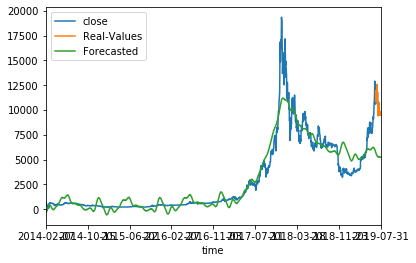

In [60]:
data_plot.plot()

In [54]:
data_plot

,close,Real-Values,Forecasted
time,,,
2014-02-07,695.650000,nan,nan
2014-02-08,648.780000,nan,nan
2014-02-09,659.570000,nan,nan
2014-02-10,582.630000,nan,nan
2014-02-11,578.960000,nan,nan
2014-02-12,531.130000,nan,nan
2014-02-13,451.440000,nan,nan
2014-02-14,427.680000,nan,nan
2014-02-15,371.070000,nan,nan


RMSE:  5385.119963892309
MAE:  5289.786228091217


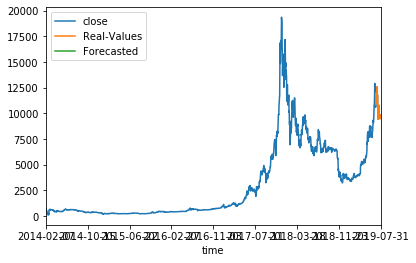

In [15]:
pred_values = forecast[['ds','yhat']].iloc[-30:]

data_plot = pd.DataFrame()
data_plot = data['close']
data_plot.index = data['time']

test.index = test['ds']
pred_values.index = pred_values['ds']

data_plot = pd.DataFrame(data_plot)
data_plot['Real-Values'] = test['y']
#data_plot['Predicted-Values'] = pred_values['yhat']
k = forecast['yhat']
k.index = forecast['ds']
data_plot['Forecasted'] = k[::-1]
data_plot.plot()

print('RMSE: ',np.sqrt(metrics.mean_squared_error(test['y'],pred_values['yhat'])))
print('MAE: ',metrics.mean_absolute_error(test['y'],pred_values['yhat']))

In [6]:
def supres(low, high, n=28, min_touches=2, stat_likeness_percent=1.5, bounce_percent=5):
    """Support and Resistance Testing
    Identifies support and resistance levels of provided price action data.
    Args:
        n(int): Number of frames to evaluate
        low(pandas.Series): A pandas Series of lows from price action data.
        high(pandas.Series): A pandas Series of highs from price action data.
        min_touches(int): Minimum # of touches for established S&R.
        stat_likeness_percent(int/float): Acceptable margin of error for level.
        bounce_percent(int/float): Percent of price action for established bounce.
    
    ** Note **
        If you want to calculate support and resistance without regard for
        candle shadows, pass close values for both low and high.
    Returns:
        sup(float): Established level of support or None (if no level)
        res(float): Established level of resistance or None (if no level)
    """
    import pandas as pd
    import numpy as np

    # Collapse into dataframe
    df = pd.concat([high, low], keys = ['high', 'low'], axis=1)
    df['sup'] = pd.Series(np.zeros(len(low)))
    df['res'] = pd.Series(np.zeros(len(low)))
    df['sup_break'] = pd.Series(np.zeros(len(low)))
    df['sup_break'] = 0
    df['res_break'] = pd.Series(np.zeros(len(high)))
    df['res_break'] = 0
    
    for x in range((n-1)+n, len(df)):
        # Split into defined timeframes for analysis
        tempdf = df[x-n:x+1]
        
        # Setting default values for support and resistance to None
        sup = None
        res = None
        
        # Identifying local high and local low
        maxima = tempdf.high.max()
        minima = tempdf.low.min()
        
        # Calculating distance between max and min (total price movement)
        move_range = maxima - minima
        
        # Calculating bounce distance and allowable margin of error for likeness
        move_allowance = move_range * (stat_likeness_percent / 100)
        bounce_distance = move_range * (bounce_percent / 100)
        
        # Test resistance by iterating through data to check for touches delimited by bounces
        touchdown = 0
        awaiting_bounce = False
        for y in range(0, len(tempdf)):
            if abs(maxima - tempdf.high.iloc[y]) < move_allowance and not awaiting_bounce:
                touchdown = touchdown + 1
                awaiting_bounce = True
            elif abs(maxima - tempdf.high.iloc[y]) > bounce_distance:
                awaiting_bounce = False
        if touchdown >= min_touches:
            res = maxima
        # Test support by iterating through data to check for touches delimited by bounces
        touchdown = 0
        awaiting_bounce = False
        for y in range(0, len(tempdf)):
            if abs(tempdf.low.iloc[y] - minima) < move_allowance and not awaiting_bounce:
                touchdown = touchdown + 1
                awaiting_bounce = True
            elif abs(tempdf.low.iloc[y] - minima) > bounce_distance:
                awaiting_bounce = False
        if touchdown >= min_touches:
            sup = minima
        if sup:
            df['sup'].iloc[x] = sup
        if res:
            df['res'].iloc[x] = res
    res_break_indices = list(df[(np.isnan(df['res']) & ~np.isnan(df.shift(1)['res'])) & (df['high'] > df.shift(1)['res'])].index)
    for index in res_break_indices:
        df['res_break'].at[index] = 1
    sup_break_indices = list(df[(np.isnan(df['sup']) & ~np.isnan(df.shift(1)['sup'])) & (df['low'] < df.shift(1)['sup'])].index)
    for index in sup_break_indices:
        df['sup_break'].at[index] = 1
    ret_df = pd.concat([df['sup'], df['res'], df['sup_break'], df['res_break']], keys = ['sup', 'res', 'sup_break', 'res_break'], axis=1)
    return ret_df

In [8]:
df_btc = df[df['coin'] == 'BTC']

In [10]:
test = supres(df_btc['low'],df_btc['high'])

In [16]:
df_btc['Support'] = test['sup']
df_btc['Resistance'] = test['res']

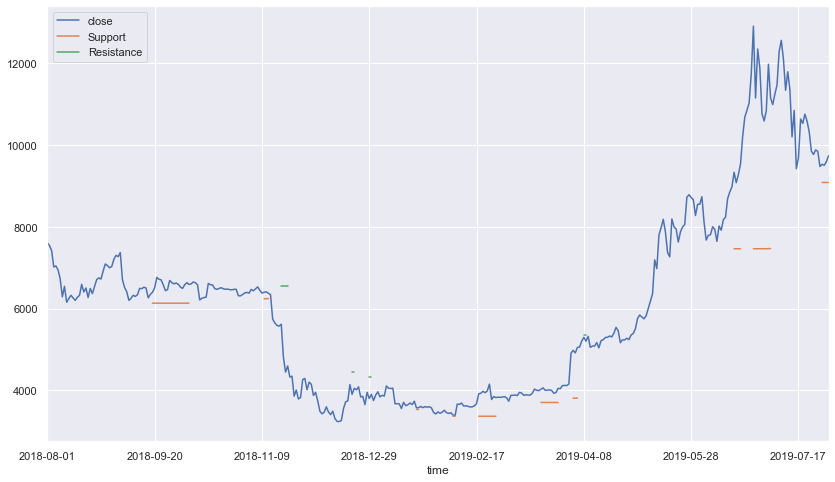

In [36]:
df_btc[['close','Support','Resistance']][-365:].plot()

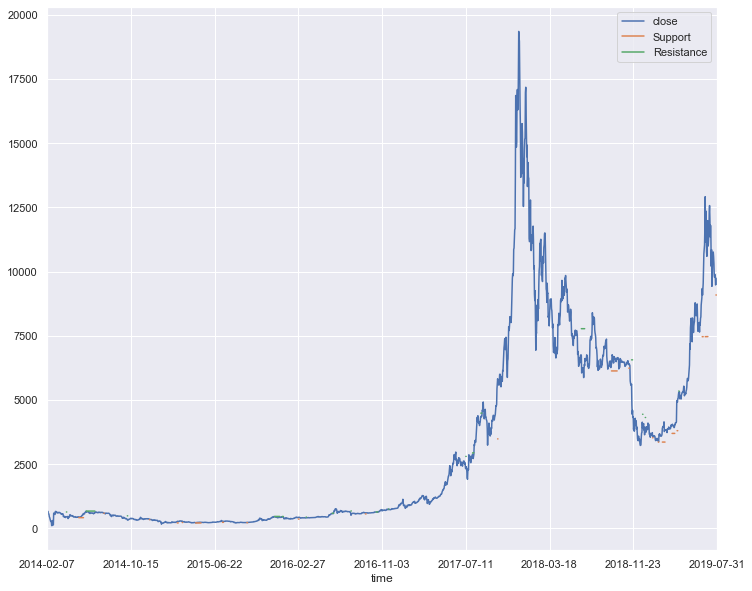

In [27]:
df_btc[['close','Support','Resistance']].plot(figsize=(12,10))

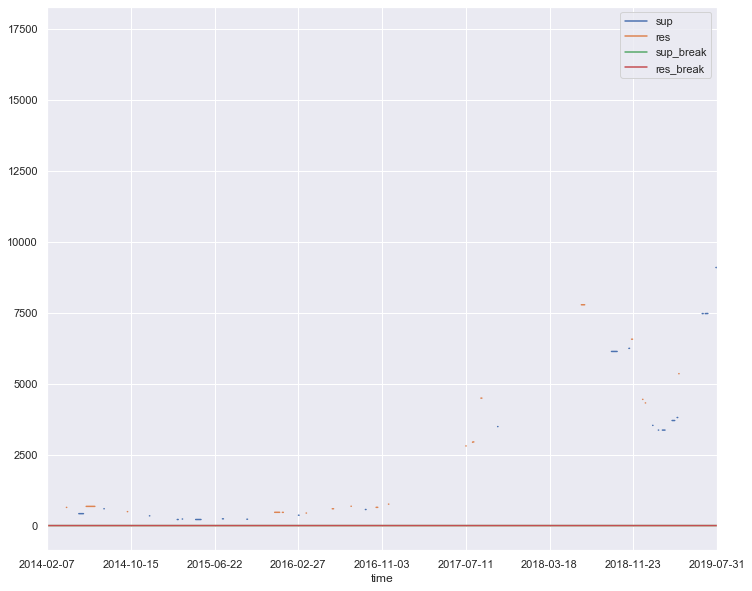

In [26]:
test.plot(figsize=(12,10))

In [14]:
df_btc.shape

(2001, 8)

In [15]:
test.shape

(2001, 4)

In [38]:
!pip install EMD-signal

  Stored in directory: C:\Users\Aagam\AppData\Local\pip\Cache\wheels\f1\e8\dd\9f556a40a05a231004be7b84684c75f16aeec31c1140c90949
  Stored in directory: C:\Users\Aagam\AppData\Local\pip\Cache\wheels\51\30\d1\92a39ba40f21cb70e53f8af96eb98f002a781843c065406500
  Stored in directory: C:\Users\Aagam\AppData\Local\pip\Cache\wheels\6a\0c\53\ea8dd63608f75c1e7a64d5c5ce5d1e6d04f15ae8a6fce4c2a0
  Stored in directory: C:\Users\Aagam\AppData\Local\pip\Cache\wheels\c9\de\a4\a91eec4eea652104d8c81b633f32ead5eb57d1b294eab24167
  Stored in directory: C:\Users\Aagam\AppData\Local\pip\Cache\wheels\eb\9a\db\5ffb9084bad31e21865893927f8433d7dda20bab180968302b
  Stored in directory: C:\Users\Aagam\AppData\Local\pip\Cache\wheels\93\db\97\496f1d6bbcad1fecbc58fe45363540414be519312eded82bab
Successfully built pathos numpydoc ppft dill pox snowballstemmer


In [39]:
from PyEMD import EMD
import numpy as np

In [40]:
emd = EMD()
IMFs = emd(df_btc['close'])

INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.EMD:Max iterations reached for IMF. Continuing with another IMF.
INFO:PyEMD.E

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


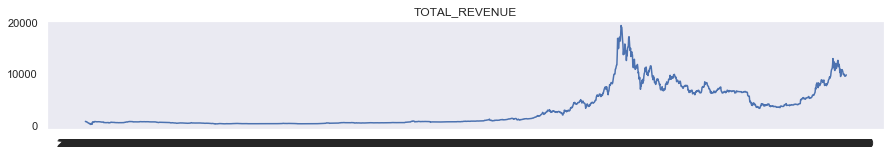

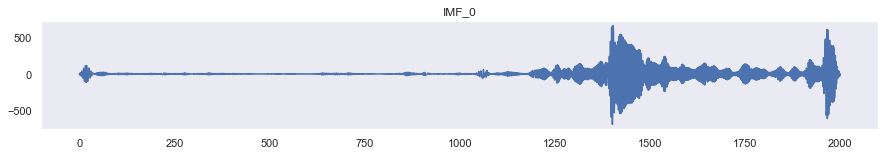

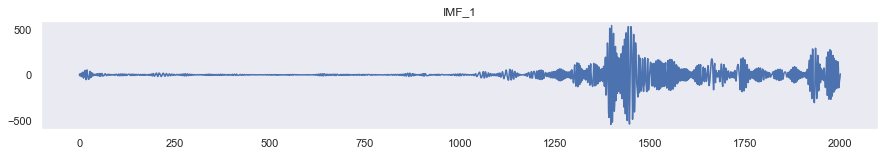

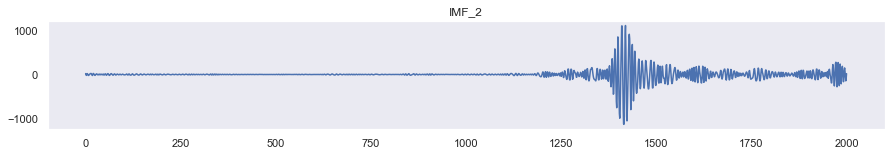

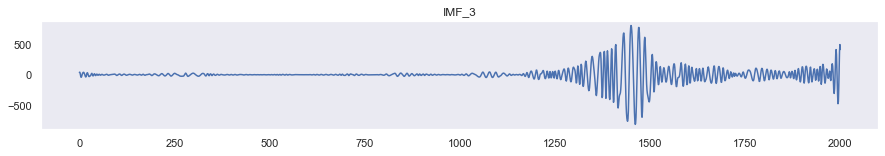

...

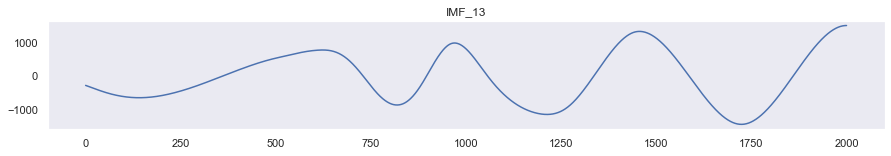

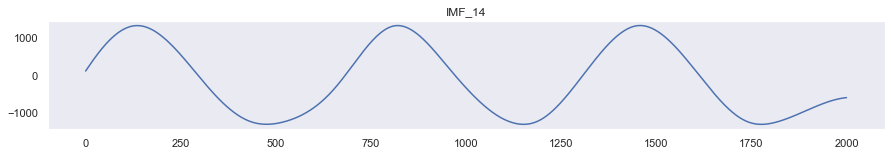

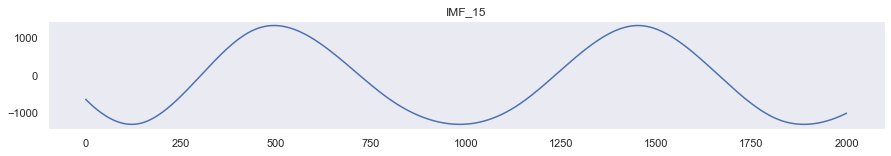

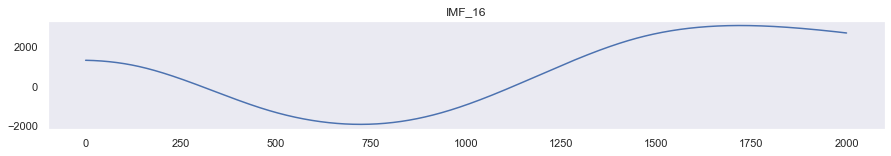

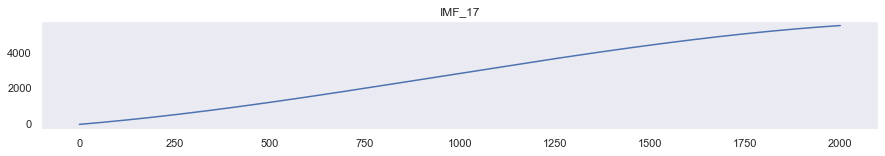

In [48]:
plt.figure(figsize=(15,2))
plt.plot(df_btc['close'])#df_res_m['TOTAL_RRVENUE'])
plt.grid()
plt.title('TOTAL_REVENUE')
plt.show()

t = pd.DataFrame()
for i in range(len(IMFs)):
    t['IMF_'+str(i)] = IMFs[i,:]
    plt.figure(figsize=(15,2))
    plt.plot(IMFs[i,:])
    plt.grid()
    plt.title('IMF_'+str(i))
    plt.show()